In [ ]:
import numpy as np          # Numpy es para arreglos numéricos
import pylab as plt         # Pylab es para graficación 
import pandas as pd         # Pandas es para manejo de Tablas de datos
import matplotlib.patches as mpatches

In [ ]:
data_PF = pd.read_csv('/content/DataPF_Agromet.txt', sep=',')
data_PF

,DateTime,ET,PA,RH,SU,TA,TAU,T_DEW,VPD,WS,NETRAD_1_1_1,P_RAIN_1_1_1,SHF_1_1_1,TS_1_1_1,CPA,Unnamed: 15,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20
0,2021-06-10 00:00,-0.000508,88494.67071,79.945764,0.013255,293.225970,0.003173,289.610311,469.318435,0.592265,-16.162213,0.0000,-2.387735,294.850000,1017.202111,NaN,NaN,NaN,NaN,NaN,NaN
1,2021-06-10 00:30,-0.001216,88462.21236,81.670049,0.013256,292.876848,0.006897,289.605662,419.785046,0.278911,-15.558203,0.0000,-2.534228,294.850000,1017.196193,NaN,NaN,NaN,NaN,NaN,NaN
2,2021-06-10 01:00,-0.000225,88438.30775,82.124529,0.013327,292.868429,0.002224,289.684533,409.159236,0.391232,-16.588043,0.0001,-2.673749,294.850000,1017.259732,NaN,NaN,NaN,NaN,NaN,NaN
3,2021-06-10 01:30,-0.000699,88381.61552,81.608444,0.013144,292.737588,0.006558,289.458261,417.575882,0.545416,-24.856523,0.0000,-2.803189,294.848330,1017.091831,NaN,NaN,NaN,NaN,NaN,NaN
4,2021-06-10 02:00,-0.000196,88315.41917,81.197594,0.012847,292.441354,0.002624,289.091009,419.126813,0.726292,-26.225137,0.0000,-2.928018,294.846107,1016.818799,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
687,2021-06-24 07:30,0.158953,88475.93185,70.803861,0.013410,295.388693,0.033435,289.787599,780.228968,0.724765,224.154100,0.0000,-4.417391,294.832763,1017.384393,NaN,NaN,NaN,NaN,NaN,NaN
688,2021-06-24 08:00,0.128849,88485.12786,68.806705,0.013615,296.110678,0.093087,290.026700,870.918011,1.285210,319.551233,0.0000,-3.985529,294.812777,1017.584130,NaN,NaN,NaN,NaN,NaN,NaN
689,2021-06-24 08:30,0.189365,88489.46870,64.587363,0.013451,296.960458,0.016258,289.837750,1040.754296,1.116804,410.942533,0.0000,-3.357094,294.750560,1017.455471,NaN,NaN,NaN,NaN,NaN,NaN
690,2021-06-24 09:00,0.235598,88499.67172,56.971849,0.012727,298.139304,0.047708,288.977973,1357.154765,0.604267,508.180233,0.0000,-2.564792,294.718330,1016.835114,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
fechas= pd.to_datetime(data_PF['DateTime'],format="%Y-%m-%d %H:%M")
fechas

0     2021-06-10 00:00:00
1     2021-06-10 00:30:00
2     2021-06-10 01:00:00
3     2021-06-10 01:30:00
4     2021-06-10 02:00:00
              ...        
687   2021-06-24 07:30:00
688   2021-06-24 08:00:00
689   2021-06-24 08:30:00
690   2021-06-24 09:00:00
691   2021-06-24 09:30:00
Name: DateTime, Length: 692, dtype: datetime64[ns]

In [ ]:
Rn = data_PF['NETRAD_1_1_1']*0.0018   # Conversión a MJ/m^-2*hora
G = data_PF['SHF_1_1_1']*0.0018       # Conversión a MJ/m^-2*hora

TS= data_PF['TS_1_1_1'] -273.15       # Conversión de K a °C
T_DEW = data_PF['T_DEW']-273.15       # Conversión de K a °C
TA = data_PF['TA'] - 273.15           # Conversión de K a °C
PA = data_PF['PA']*0.001              # Conversión de Pa a kPa
VPD = data_PF['VPD']*0.001            # Conversión de Pa a kPa

#Parte I : Visualizar información de la Estación Meteorológica

In [ ]:
fig, axs = plt.subplots(7, 2, figsize=(40, 40), sharex=True,dpi=500)

axs[0, 0].plot(fechas,data_PF['ET'], color = 'r')
axs[0, 0].set_ylabel('Flujo de Evapotranspiración (mm)',fontsize=14)
axs[0, 0].grid()

axs[1, 0].plot(fechas,PA,color = 'b')
axs[1, 0].set_ylabel('Presión Atmosférica (kPa)',fontsize=14)
axs[1, 0].grid()

axs[2, 0].plot(fechas, data_PF['RH'],color = 'g')
axs[2, 0].set_ylabel('Humedad Relativa (%)',fontsize=14)
axs[2, 0].grid()

axs[3, 0].plot(fechas, data_PF['SU'], color = 'gold')
axs[3, 0].set_ylabel('Humedad específica (kg/kg)',fontsize=14)
axs[3, 0].grid()

axs[4, 0].plot(fechas,TA,color = 'orangered')
axs[4, 0].set_ylabel('Temperatura del aire (°C)',fontsize=14)
axs[4, 0].grid()

axs[5, 0].plot(fechas,data_PF['TAU'],color = 'gray')
axs[5, 0].set_ylabel('Flujo turbulento de momentum (kg/m*s^2)',fontsize=14)
axs[5, 0].grid()

axs[6, 0].plot(fechas,T_DEW,color = 'yellowgreen')
axs[6, 0].set_ylabel('Temperatura de Rocío (°C)',fontsize=14)
axs[6, 0].grid()

axs[0, 1].plot(fechas,VPD,color = 'turquoise')
axs[0, 1].set_ylabel('Déficit de Presión de vapor (kPa)',fontsize=14)
axs[0, 1].grid()

axs[1, 1].plot(fechas,data_PF['WS'],color = 'orange')
axs[1, 1].set_ylabel('Velocidad del viento (m/s)',fontsize=14)
axs[1, 1].grid()

axs[2, 1].plot(fechas, Rn, color ='deepskyblue')
axs[2, 1].set_ylabel('Radiación Neta (MJ/m^2)',fontsize=14)
axs[2, 1].grid()


axs[3, 1].plot(fechas,data_PF['P_RAIN_1_1_1'],color = 'purple')
axs[3, 1].set_ylabel('Precipitación (m)',fontsize=14)
axs[3, 1].grid()

axs[4, 1].plot(fechas,G,color = 'tab:blue')
axs[4, 1].set_ylabel('Flujo de calor del suelo (W/m^2)',fontsize=14)
axs[4, 1].grid()

axs[5, 1].plot(fechas,TS,color = 'indigo')
axs[5, 1].set_ylabel('Temperatura del suelo (°C)',fontsize=14)
axs[5, 1].grid()

axs[6, 1].plot(fechas,data_PF['CPA'],color = 'darkkhaki')
axs[6, 1].set_ylabel('Capacidad Calorífica del aire (J/kg*K)',fontsize=14)
axs[6, 1].grid()



fig.autofmt_xdate()

# Parte II: Cálculo horario de ETo

In [ ]:
A = 0.6108*np.exp((17.27*TA)/(TA+237.3))

In [ ]:
e_a = data_PF['RH']*A/100  

In [ ]:
DELTA = 4098*A/(TA+237.3)**2 

In [ ]:
cte_psico = 1.013e-3*PA/2.45*0.622 

In [ ]:
u_2 = data_PF['WS']

In [ ]:
B = 0.408*DELTA*(Rn - G)
C = cte_psico*(37/(TA+273))*u_2*(A - e_a)
D = DELTA + cte_psico*(1+0.34*u_2)

In [ ]:
Eto = (B + C)/D 

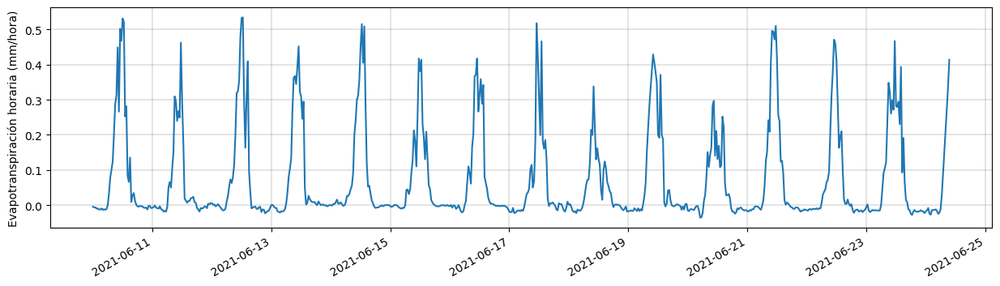

In [ ]:
fig = plt.figure(figsize=(15,4),dpi=100)
plt.plot(fechas,Eto)
plt.ylabel('Evapotranspiración horaria (mm/hora)')
plt.grid(True, linewidth=0.3, color = 'gray')
fig.autofmt_xdate()

# Cálculo de Eto diario

In [ ]:
rns = data_PF['NETRAD_1_1_1']*0.0864
rns = rns[0:672]
rns = np.split(rns,14)
rns = np.mean(rns,axis=1)
rns

array([12.14825481,  6.66924468, 11.0394282 ,  9.57269808, 10.99924594,
        8.65143776,  9.38786592,  7.45497832,  5.57128554, 10.47188488,
        5.75693794, 10.59748408,  7.96097225,  9.92870341])

In [ ]:
s = pd.Series(pd.date_range('2021-06-10-00', periods=14, freq='D'))

In [ ]:
tempd = TA[0:672]
tempd = np.split(tempd,14)
tempd = np.mean(tempd,axis=1)

In [ ]:
u_2d = u_2[0:672]
u_2d = np.split(u_2d,14)
u_2d = np.mean(u_2d,axis=1)


In [ ]:
temp = TA[0:672]
temp = np.split(temp,14)
tempmin = np.min(temp,axis=1)
tempmax = np.max(temp,axis=1)

e_tmax = 0.6108*np.exp((17.27*tempmax)/(tempmax+237.3))
e_tmin = 0.6108*np.exp((17.27*tempmin)/(tempmin+237.3))

e_sd = (e_tmax + e_tmin)/2

In [ ]:
A = 0.6108*np.exp((17.27*TA)/(TA+237.3))
e_ad = data_PF['RH']*A/100

e_ad = e_ad[0:672]
e_ad = np.split(e_ad,14)
e_ad = np.mean(e_ad,axis=1)

In [ ]:
DELTAd = 4098*A/(TA+237.3)**2


DELTAd = DELTAd[0:672]
DELTAd = np.split(DELTAd,14)
DELTAd = np.mean(DELTAd,axis=1)

In [ ]:
cte_psicod = 1.013e-3*PA/2.45*0.622
cte_psicod = cte_psicod[0:672]
cte_psicod = np.split(cte_psicod,14)
cte_psicod = np.mean(cte_psicod,axis=1)

In [ ]:
Ad= A[0:672]

Ad = np.split(Ad,14)
Ad = np.mean(Ad,axis=1)

In [ ]:
rh = data_PF['RH'][0:672]

rh = np.split(rh,14)
rh = np.mean(rh,axis=1)

In [ ]:
Bd = 0.408*DELTAd*(rns)
Cd = cte_psicod*(900/(tempd+273))*u_2d*(e_sd - e_ad)
Dd = DELTAd + cte_psicod*(1+0.34*u_2d)

Etod = (Bd + Cd)/Dd

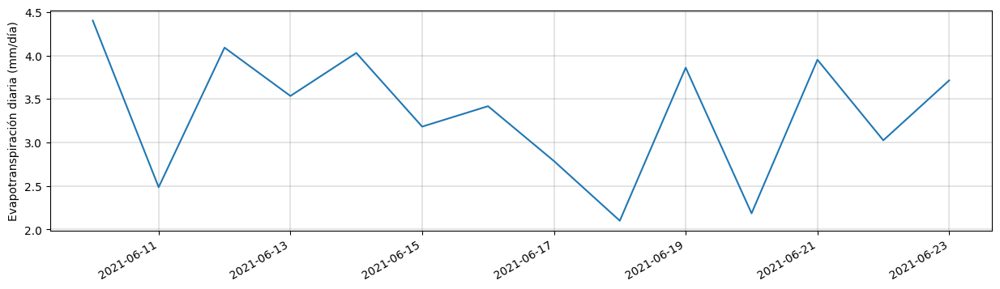

In [ ]:
fig = plt.figure(figsize=(15,4),dpi=100)
plt.plot(s,Etod)
plt.ylabel('Evapotranspiración diaria (mm/día)')
plt.grid(True, linewidth=0.3, color = 'gray')
fig.autofmt_xdate()

# Cálculo de Eto con el método de Hargreaves

In [ ]:
temp = TA[0:672]
temp = np.split(temp,14)
tempmin = np.min(temp,axis=1)
tempmax = np.max(temp,axis=1)
tempmed = np.mean(temp, axis=1)

In [ ]:
R_ad = [37.02847216, 37.01531054, 37.00297015, 36.99146884, 36.98082273,
       36.97104619, 36.96215184, 36.95415052, 36.94705131, 36.94086146,
       36.93558646, 36.93123   , 36.92779393, 36.92527834]

In [ ]:
X = 0.0023*(tempmed + 17.8)
Y = (tempmax - tempmin)**(0.5)

ETo_H = X*Y*R_ad

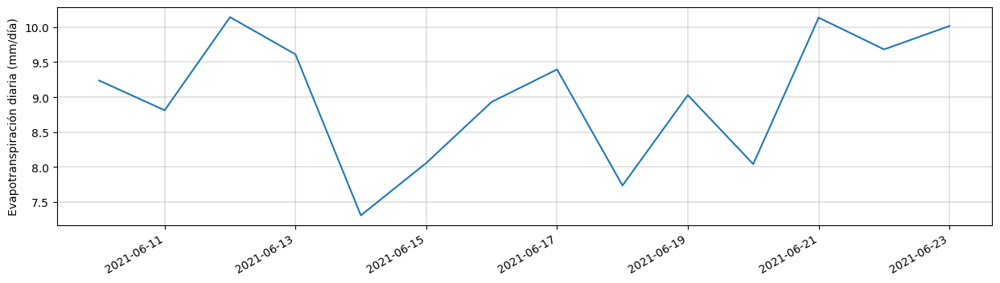

In [ ]:
fig = plt.figure(figsize=(15,4),dpi=100)
plt.plot(s,ETo_H)
plt.ylabel('Evapotranspiración diaria (mm/día)')
plt.grid(True, linewidth=0.3, color = 'gray')
fig.autofmt_xdate()

# PARTE III. Uso de la constante para café y de ETo

In [ ]:
kc = 0.95 #Para suelo sin cobertura
kc2 = 1.10 #Para suelo con malezas

In [ ]:
Etc = Eto*kc
Etc2 = Eto*kc2

In [ ]:
error = data_PF['ET'] - Etc

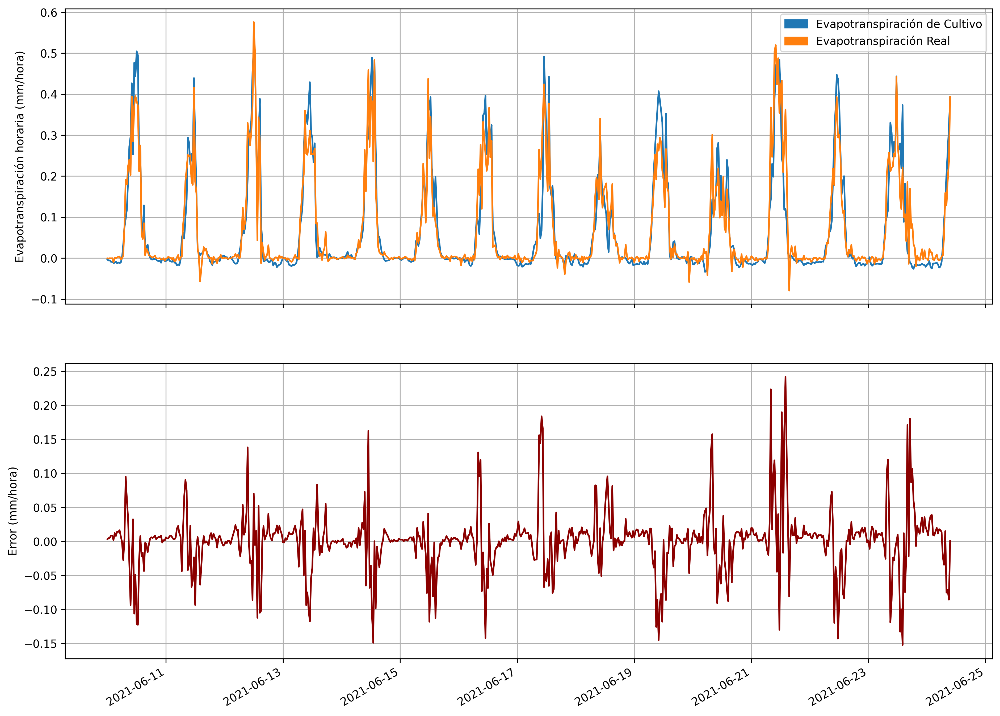

In [ ]:
fig, (ax1,ax2) = plt.subplots(2, 1, figsize=(15, 12), sharex=True,dpi=300)

ax1.plot(fechas,Etc)
ax1.plot(fechas, data_PF['ET'])
ax1.set_ylabel('Evapotranspiración horaria (mm/hora)')
ax1.grid()

Etc_patch = mpatches.Patch(color='tab:blue', label='Evapotranspiración de Cultivo')
ET_patch = mpatches.Patch(color='tab:orange', label='Evapotranspiración Real')
ax1.legend(handles=[Etc_patch, ET_patch],loc="best" )


ax2.plot(fechas,error, color = 'darkred')
ax2.set_ylabel('Error (mm/hora)')
ax2.grid()

fig.autofmt_xdate()

In [ ]:
Etodc = Etod*kc

ET = data_PF['ET'][0:672]

ET = np.split(ET,14)
ET = np.sum(ET,axis=1)

In [ ]:
errord = ET - Etodc

In [ ]:
np.sum(errord)

3.129006932048801

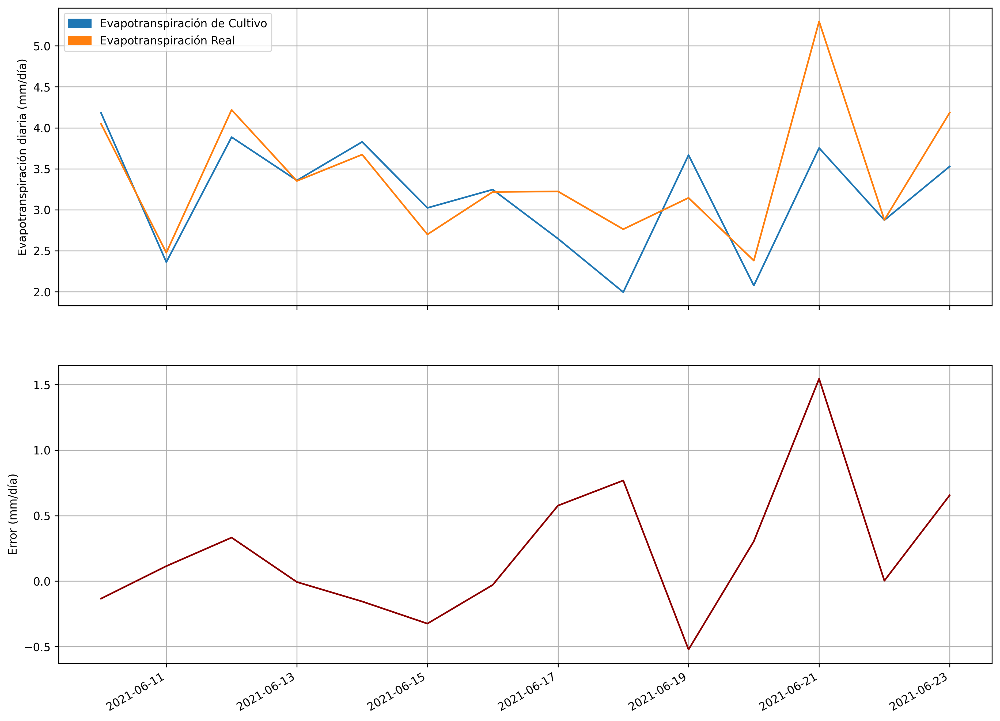

In [ ]:
fig, (ax1,ax2) = plt.subplots(2, 1, figsize=(15, 12), sharex=True,dpi=300)

ax1.plot(s,Etodc)
ax1.plot(s, ET)
ax1.set_ylabel('Evapotranspiración diaria (mm/día)')
ax1.grid()

Etc_patch = mpatches.Patch(color='tab:blue', label='Evapotranspiración de Cultivo')
ET_patch = mpatches.Patch(color='tab:orange', label='Evapotranspiración Real')
ax1.legend(handles=[Etc_patch, ET_patch],loc="best" )


ax2.plot(s,errord, color = 'darkred')
ax2.set_ylabel('Error (mm/día)')
ax2.grid()

fig.autofmt_xdate()

In [ ]:
ETo_Hd = ETo_H*kc
errorH = ET - ETo_Hd

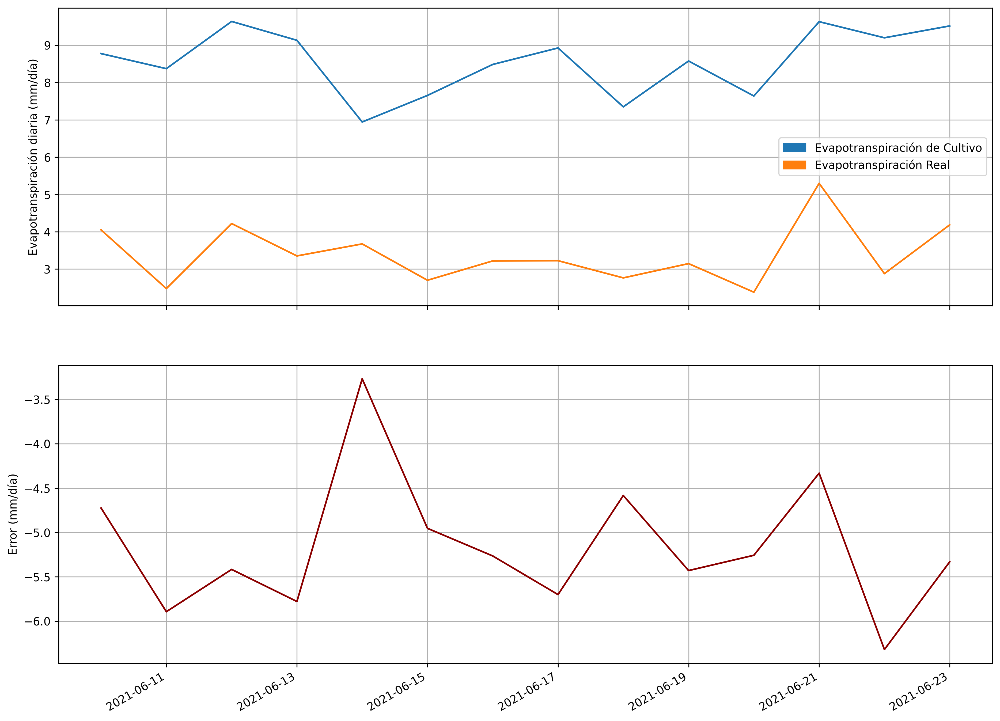

In [ ]:
fig, (ax1,ax2) = plt.subplots(2, 1, figsize=(15, 12), sharex=True,dpi=300)

ax1.plot(s,ETo_Hd)
ax1.plot(s, ET)
ax1.set_ylabel('Evapotranspiración diaria (mm/día)')
ax1.grid()

Etc_patch = mpatches.Patch(color='tab:blue', label='Evapotranspiración de Cultivo')
ET_patch = mpatches.Patch(color='tab:orange', label='Evapotranspiración Real')
ax1.legend(handles=[Etc_patch, ET_patch],loc="best" )


ax2.plot(s,errorH, color = 'darkred')
ax2.set_ylabel('Error (mm/día)')
ax2.grid()

fig.autofmt_xdate()

# PARTE IV. Cálculo de error en recurso hídrico

In [ ]:
np.sum(error)

0.4171235986947761

In [ ]:
np.sum(errord)

3.129006932048801

In [ ]:
np.sum(errorH)

-72.26665907587545

In [ ]:
#Tomando en cuenta que 1mm = 1L/m2 y que: 1tonelada = 1000L ; 1hectárea = 1000m2 se realizó la conversión de los valores a dicha unidades